#**Case study on Unsupervised learning**

Try out different clustering models in the given dataset. Find the optimum
number of clusters in each model and create the model with optimum number of
clusters. Also learn about dB scan clustering and implement it.


**Import essential libraries**

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns


**Reading data**

In [2]:
data=pd.read_csv("/content/Wine_clust .csv")
data

,Alcohol,Malic_Acid,Ash,Ash_Alcanity,Magnesium,Total_Phenols,Flavanoids,Nonflavanoid_Phenols,Proanthocyanins,Color_Intensity,Hue,OD280,Proline
0,14.23,1.71,2.43,15.6,127,2.80,3.06,0.28,2.29,5.64,1.04,3.92,1065
1,13.20,1.78,2.14,11.2,100,2.65,2.76,0.26,1.28,4.38,1.05,3.40,1050
2,13.16,2.36,2.67,18.6,101,2.80,3.24,0.30,2.81,5.68,1.03,3.17,1185
3,14.37,1.95,2.50,16.8,113,3.85,3.49,0.24,2.18,7.80,0.86,3.45,1480
4,13.24,2.59,2.87,21.0,118,2.80,2.69,0.39,1.82,4.32,1.04,2.93,735
...,...,...,...,...,...,...,...,...,...,...,...,...,...
173,13.71,5.65,2.45,20.5,95,1.68,0.61,0.52,1.06,7.70,0.64,1.74,740
174,13.40,3.91,2.48,23.0,102,1.80,0.75,0.43,1.41,7.30,0.70,1.56,750
175,13.27,4.28,2.26,20.0,120,1.59,0.69,0.43,1.35,10.20,0.59,1.56,835
176,13.17,2.59,2.37,20.0,120,1.65,0.68,0.53,1.46,9.30,0.60,1.62,840


In [3]:
#check info

data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 178 entries, 0 to 177
Data columns (total 13 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Alcohol               178 non-null    float64
 1   Malic_Acid            178 non-null    float64
 2   Ash                   178 non-null    float64
 3   Ash_Alcanity          178 non-null    float64
 4   Magnesium             178 non-null    int64  
 5   Total_Phenols         178 non-null    float64
 6   Flavanoids            178 non-null    float64
 7   Nonflavanoid_Phenols  178 non-null    float64
 8   Proanthocyanins       178 non-null    float64
 9   Color_Intensity       178 non-null    float64
 10  Hue                   178 non-null    float64
 11  OD280                 178 non-null    float64
 12  Proline               178 non-null    int64  
dtypes: float64(11), int64(2)
memory usage: 18.2 KB


In [4]:
#Check for null values

data.isna().sum()

Alcohol                 0
Malic_Acid              0
Ash                     0
Ash_Alcanity            0
Magnesium               0
Total_Phenols           0
Flavanoids              0
Nonflavanoid_Phenols    0
Proanthocyanins         0
Color_Intensity         0
Hue                     0
OD280                   0
Proline                 0
dtype: int64

**Standard scaling**

Clustering algorithms typically require feature scaling to ensure equal distance consideration
across all features. Without scaling, features with larger scales dominate the distance
calculations, leading to biased clusters.

In [5]:
from sklearn.preprocessing import StandardScaler
sc=StandardScaler()

data_sc=sc.fit_transform(data)
data_sc=pd.DataFrame(data_sc,columns=data.columns)
data_sc.head()


,Alcohol,Malic_Acid,Ash,Ash_Alcanity,Magnesium,Total_Phenols,Flavanoids,Nonflavanoid_Phenols,Proanthocyanins,Color_Intensity,Hue,OD280,Proline
0,1.518613,-0.562250,0.232053,-1.169593,1.913905,0.808997,1.034819,-0.659563,1.224884,0.251717,0.362177,1.847920,1.013009
1,0.246290,-0.499413,-0.827996,-2.490847,0.018145,0.568648,0.733629,-0.820719,-0.544721,-0.293321,0.406051,1.113449,0.965242
2,0.196879,0.021231,1.109334,-0.268738,0.088358,0.808997,1.215533,-0.498407,2.135968,0.269020,0.318304,0.788587,1.395148
3,1.691550,-0.346811,0.487926,-0.809251,0.930918,2.491446,1.466525,-0.981875,1.032155,1.186068,-0.427544,1.184071,2.334574
4,0.295700,0.227694,1.840403,0.451946,1.281985,0.808997,0.663351,0.226796,0.401404,-0.319276,0.362177,0.449601,-0.037874


##**1. Clustering with all the features**

###**1.1 KMeans Clustering**


Use elbow method to find the optimum number of clusters.

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:8

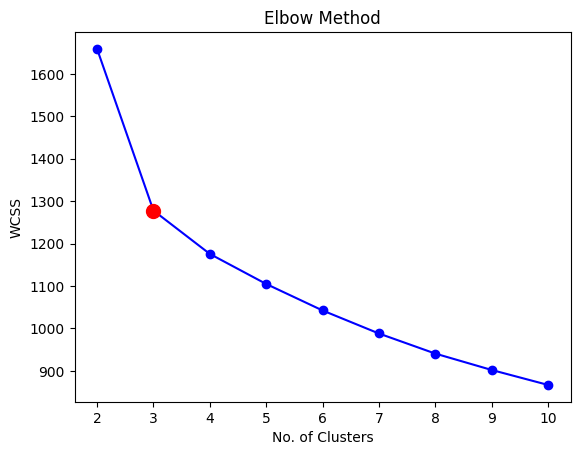

In [6]:
from sklearn.cluster import KMeans

wcss=[]
for i in range(2,11):
  kmeans=KMeans(n_clusters=i, init='k-means++', random_state=42)
  kmeans.fit(data_sc)
  wcss.append(kmeans.inertia_)

plt.plot(range(2,11),wcss,'bo-')

index = 1
index_x = range(2, 11)[index]
index_y = wcss[index]
plt.plot(index_x, index_y, 'ro', markersize=10)


plt.title('Elbow Method')
plt.xlabel('No. of Clusters')
plt.ylabel('WCSS')
plt.show()



Using **elbow method**, the optimum number of clusters = 3.

**Creating model**

In [7]:
kmeans=KMeans(n_clusters=3,init='k-means++')
kmeans.fit(data_sc)
data_sc['cluster'] = kmeans.labels_


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


**Plot Clusters**

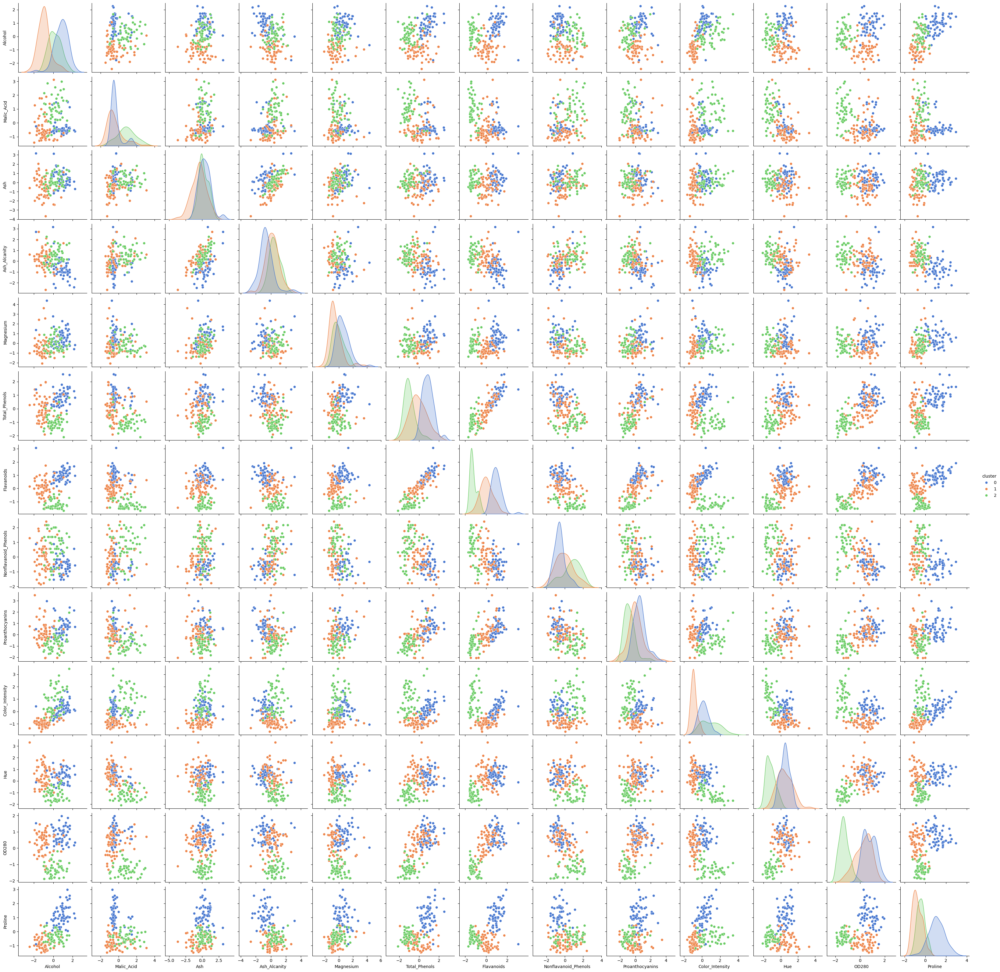

In [8]:
sns.pairplot(data_sc, hue='cluster', palette='muted')
plt.show()


**Silhouette Score**

The silhouette score is a metric used to evaluate the quality of clusters created by a clustering algorithm, such as K-means. It quantifies how similar an object is to its own cluster compared to other clusters. The silhouette score ranges from -1 to 1.

In [9]:
from sklearn.metrics import silhouette_score
sil_km=silhouette_score(data_sc,kmeans.labels_)
sil_km

0.2999306236247228

The silhouette score is less than 0.5,so clustering is average.

###**1.2 Agglomerative Clustering**

Use **Dendogram method** to find the optimum number of clusters.

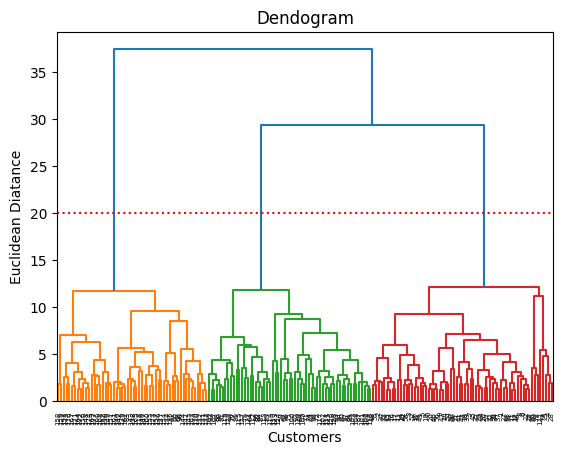

In [10]:
import scipy.cluster.hierarchy as sch

dend=sch.dendrogram(sch.linkage(data_sc,method='ward'))

plt.axhline(y=20, color='r', linestyle=':')
plt.title("Dendogram")
plt.xlabel("Customers")
plt.ylabel("Euclidean Diatance")
plt.show()

Using Dendogram method the optimum number of clusters =3.

**Create Model**

In [11]:
from sklearn.cluster import AgglomerativeClustering
hc=AgglomerativeClustering(n_clusters=3,metric='euclidean',linkage='ward')
y_hc=hc.fit_predict(data_sc)
data_sc['cluster'] = hc.labels_

**Plot Clusters**

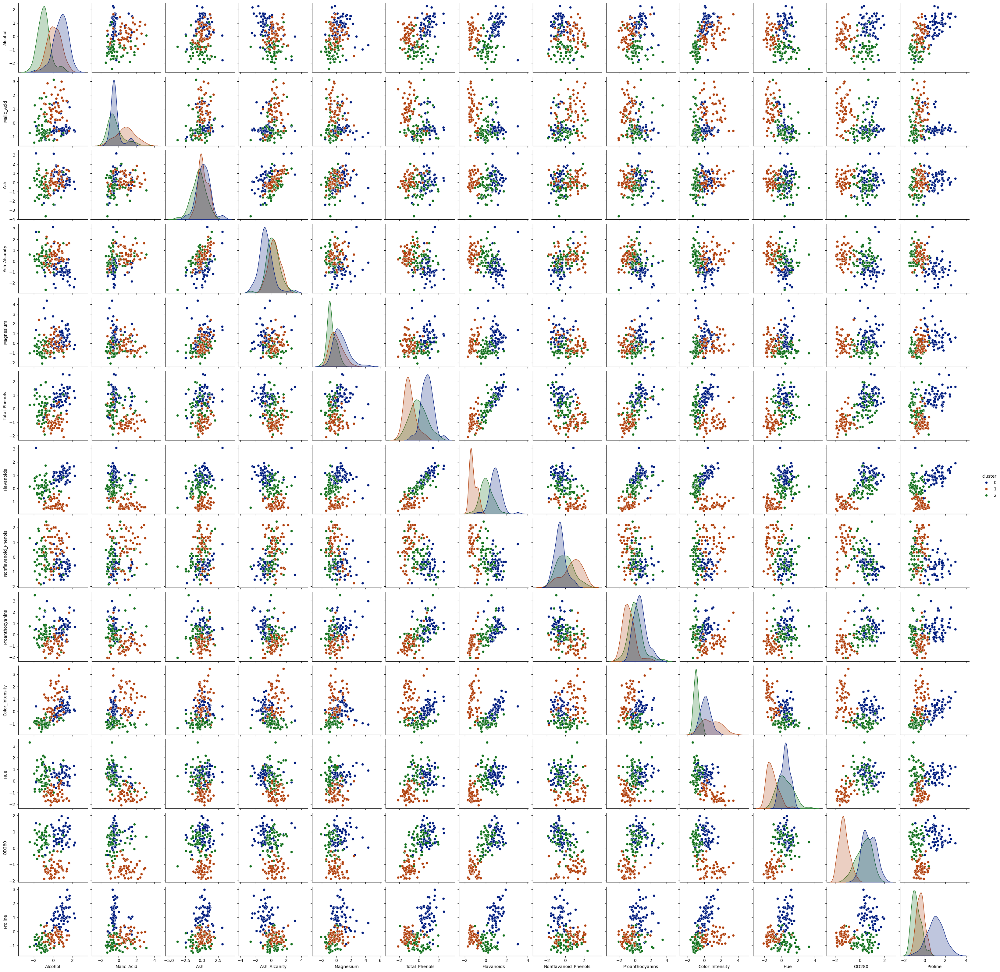

In [12]:
sns.pairplot(data_sc, hue='cluster', palette='dark')
plt.show()

**Silhouette Score**

In [13]:
sil_ac=silhouette_score(data_sc,hc.labels_)
sil_ac


0.3140442081423991

Silhouette score is less than 0.5, so clustering is average.

###**1.3 DBSCAN Clustering**

**Density-Based Spatial Clustering of Applications with Noise (DBSCAN)** is a popular clustering algorithm in machine learning. It works by grouping together points that are closely packed together, based on a density criterion.

DBSCAN is capable of finding arbitrarily shaped clusters in the data, and it's robust to outliers.In Python, you can implement DBSCAN using the DBSCAN class from the sklearn.cluster module. Adjust the eps (epsilon) and min_samples parameters to suit our data.

**Create Model**

In [14]:
from sklearn.cluster import DBSCAN

dbscan = DBSCAN(eps=2, min_samples=5).fit(data_sc)
y_db=dbscan.fit_predict(data_sc)
data_sc['cluster']=dbscan.labels_

**Plot Clusters**

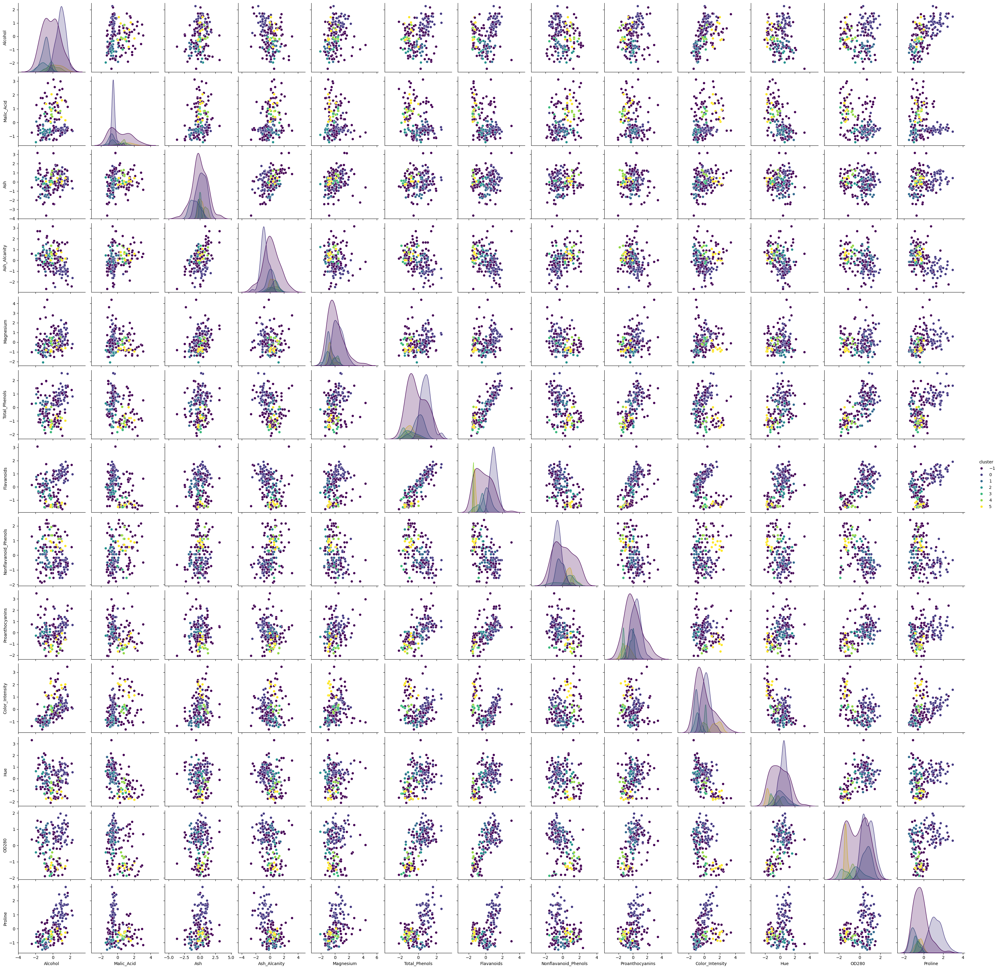

In [15]:
sns.pairplot(data_sc, hue='cluster', palette='viridis')
plt.show()

**Silhouette Score**

In [16]:
sil_db=silhouette_score(data_sc,y_db)
sil_db


0.1237790541894091

Silhoueete score is less than 0.5, clustering is average.

In [17]:
data_sc.drop('cluster',axis=1,inplace=True)

###**2.Clustering with Principal Component Analysis**

A dimensionality reduction method

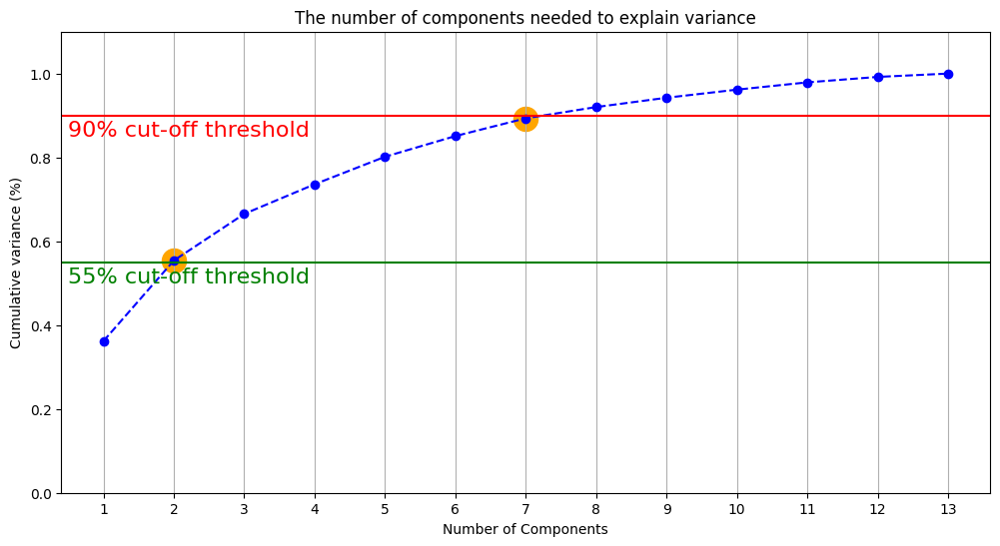

In [18]:
from sklearn.decomposition import PCA

pca=PCA().fit(data_sc)

plt.rcParams["figure.figsize"] = (12,6)

fig, ax = plt.subplots()
xi = np.arange(1, 14, step=1)
y = np.cumsum(pca.explained_variance_ratio_)

plt.ylim(0.0,1.1)
plt.plot(xi, y, marker='o', linestyle='--', color='b')
plt.xlabel('Number of Components')
plt.xticks(np.arange(0, 14, step=1)) #change from 0-based array index to 1-based human-readable label
plt.ylabel('Cumulative variance (%)')
plt.title('The number of components needed to explain variance')

plt.axhline(y=0.90, color='r', linestyle='-')
plt.text(0.5, 0.85, '90% cut-off threshold', color = 'red', fontsize=16)
plt.axhline(y=0.55, color='g', linestyle='-')
plt.text(0.5, 0.50, '55% cut-off threshold', color = 'green', fontsize=16)

plt.scatter(7, y[6], color='orange', s=300)
plt.scatter(2, y[1], color='orange', s=300)

ax.grid(axis='x')
plt.show()

###**2. PCA with 7 comonents**

In [19]:
pca=PCA(n_components=7)
pca.fit(data_sc)
x_pca=pca.transform(data_sc)

data_pca=pd.DataFrame(x_pca,columns=['PCA1','PCA2','PCA3','PCA4','PCA5','PCA6','PCA7'])
data_pca.head()

,PCA1,PCA2,PCA3,PCA4,PCA5,PCA6,PCA7
0,3.316751,-1.443463,-0.165739,-0.215631,0.693043,-0.223880,0.596427
1,2.209465,0.333393,-2.026457,-0.291358,-0.257655,-0.927120,0.053776
2,2.516740,-1.031151,0.982819,0.724902,-0.251033,0.549276,0.424205
3,3.757066,-2.756372,-0.176192,0.567983,-0.311842,0.114431,-0.383337
4,1.008908,-0.869831,2.026688,-0.409766,0.298458,-0.406520,0.444074


**2.1 KMeans Clustering**

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:8

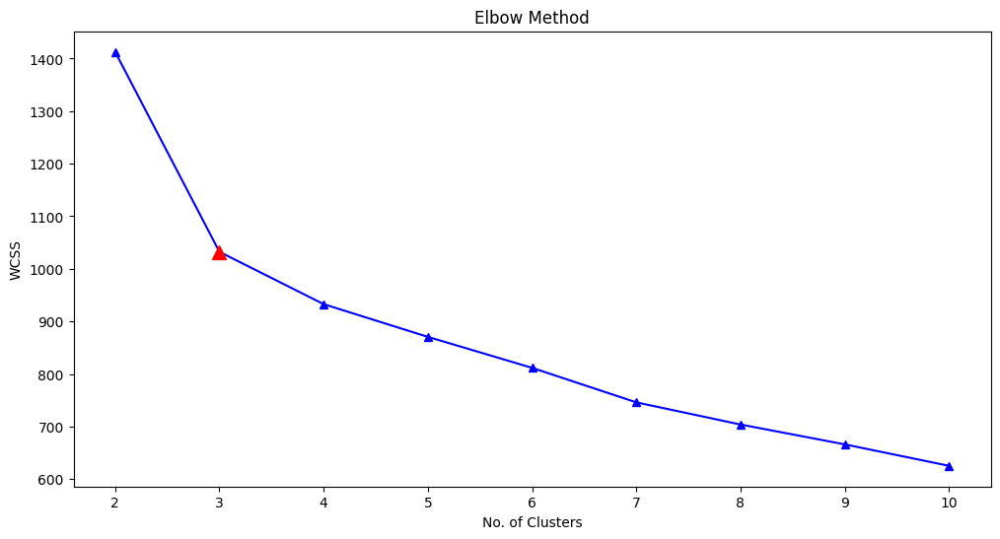

In [20]:
wcss=[]
for i in range(2,11):
  kmeans=KMeans(n_clusters=i, init='k-means++', random_state=42)
  kmeans.fit(data_pca)
  wcss.append(kmeans.inertia_)

plt.plot(range(2,11),wcss,'b^-')

index = 1
index_x = range(2, 11)[index]
index_y = wcss[index]
plt.plot(index_x, index_y, '^', markersize=10,color='r')


plt.title('Elbow Method')
plt.xlabel('No. of Clusters')
plt.ylabel('WCSS')
plt.show()



Using Elbow method optimum nummber of clusters =3.



**Create Model**

In [21]:
kmeans=KMeans(n_clusters=3,init='k-means++')
kmeans.fit(data_pca)
data_pca['cluster'] = kmeans.labels_


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


**PLot clusters**

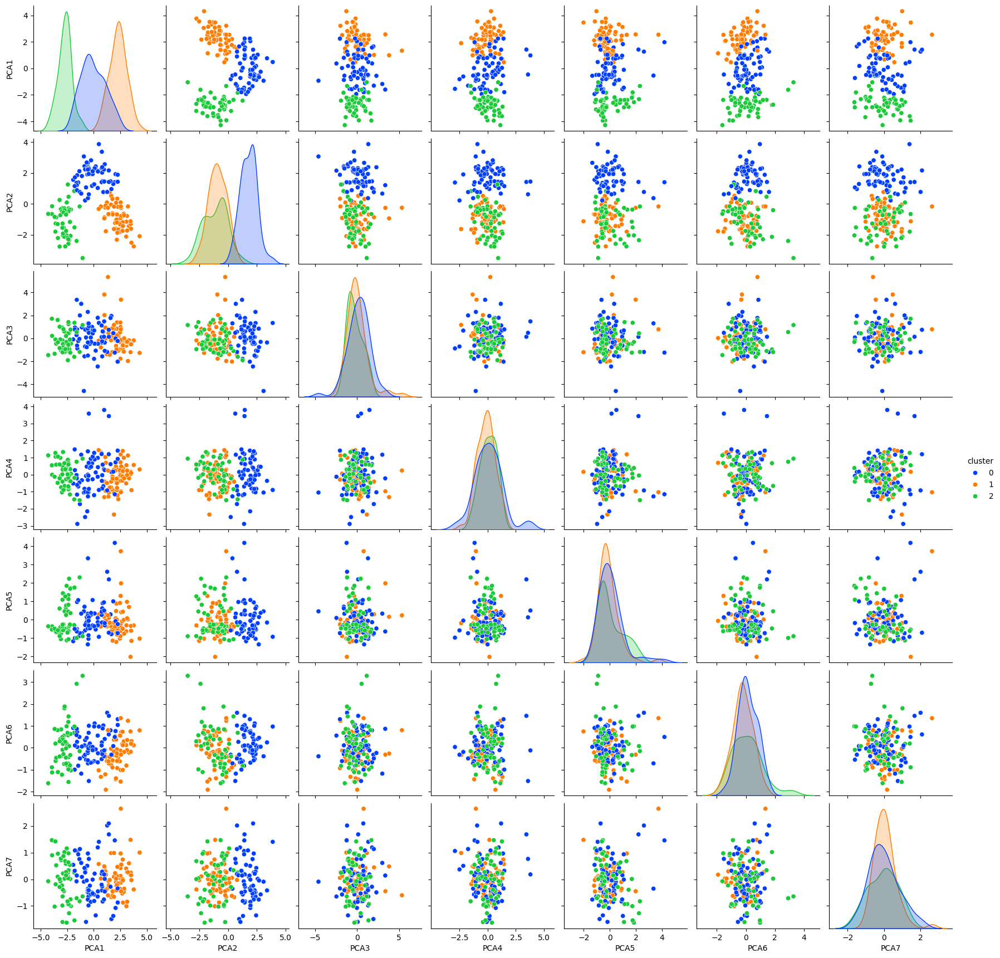

In [22]:

sns.pairplot(data_pca, hue='cluster', palette='bright')
plt.show()

**Silhoutte Score**

In [23]:
sil_PCA_KM1=silhouette_score(data_pca,kmeans.labels_)
sil_PCA_KM1


0.358444172607036

In [24]:
data_pca.drop('cluster',axis=1,inplace=True)


Silhouette score is less than 0.5 which means clustering is average.

**2.2 Agglomerative clustering**

**Dendogram**

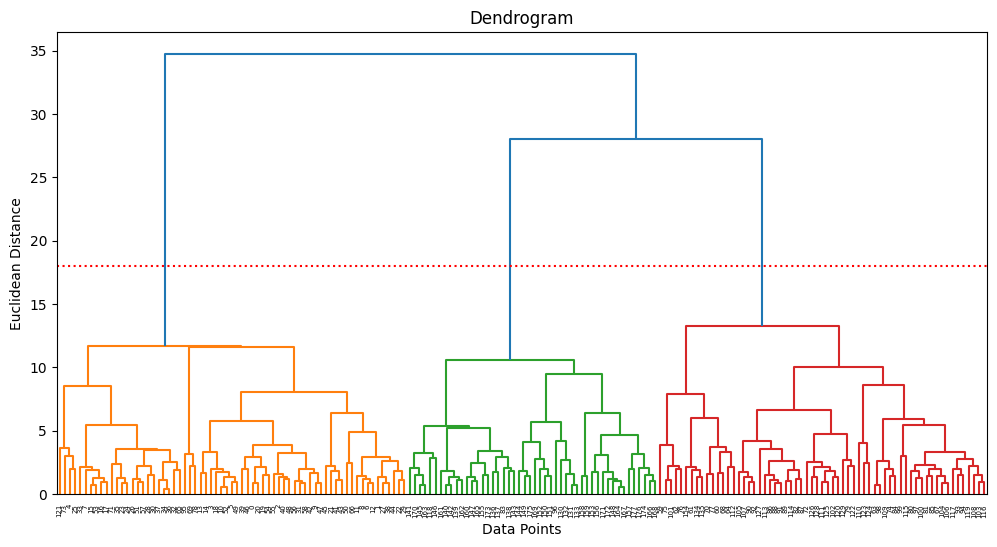

In [25]:

dend=sch.dendrogram(sch.linkage(data_pca,method='ward'))

plt.axhline(y=18, color='red', linestyle=':')
plt.title('Dendrogram')
plt.xlabel('Data Points')
plt.ylabel('Euclidean Distance')
plt.show()


Using Dendogram, Optimum no. of clusters = 3


**Create model**

In [26]:
hc=AgglomerativeClustering(n_clusters=3,metric='euclidean',linkage='ward')
hc.fit(data_pca)
data_pca['cluster'] = hc.labels_


**Plot Clusters**

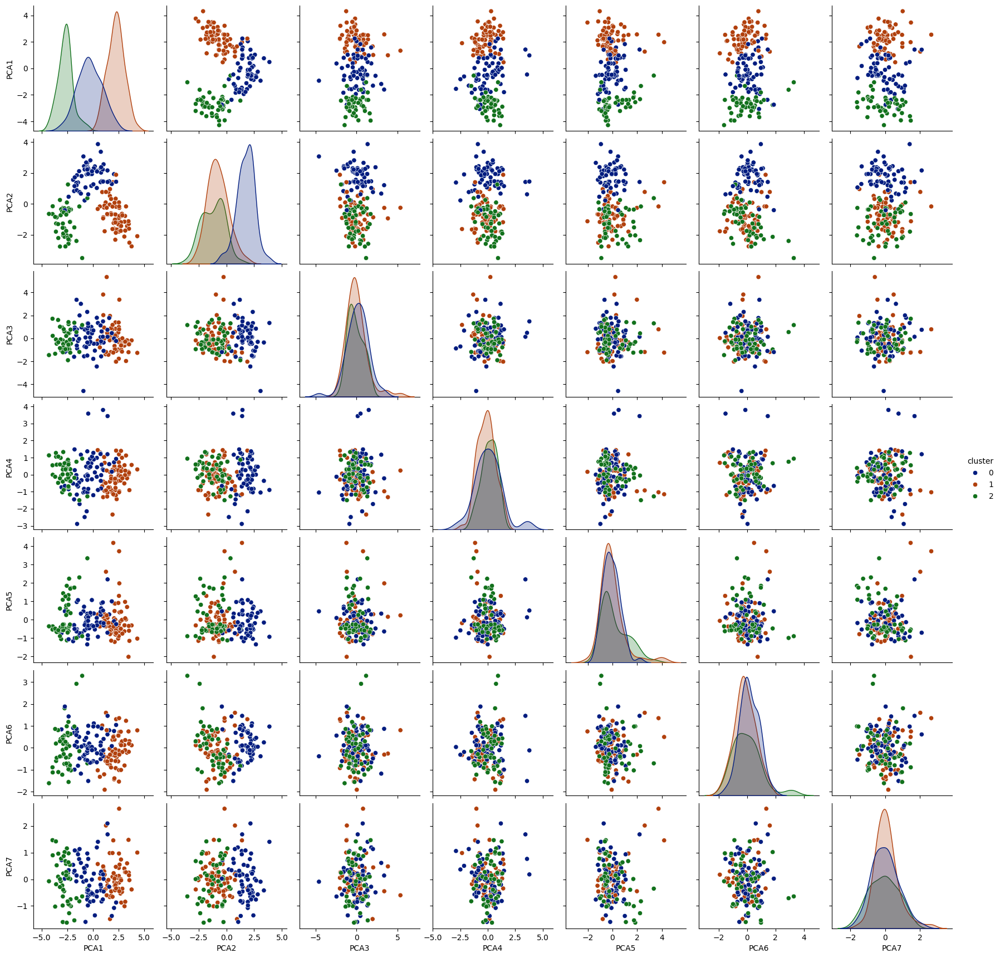

In [27]:
sns.pairplot(data_pca, hue='cluster', palette='dark')
plt.show()

**Silhouette Score**

In [28]:
sil_PCA_ac1=silhouette_score(data_pca,hc.labels_)
sil_PCA_ac1


0.3418527405229551

Silhouette score is less than 0.5 which means clustering is average.

**2.3 DBSCAN Clustering**

In [30]:
dbscan=DBSCAN(eps=1.95, min_samples=5).fit(data_pca)
y_db=dbscan.fit_predict(data_pca)
data_pca['cluster']=dbscan.labels_


**Plot cluster**

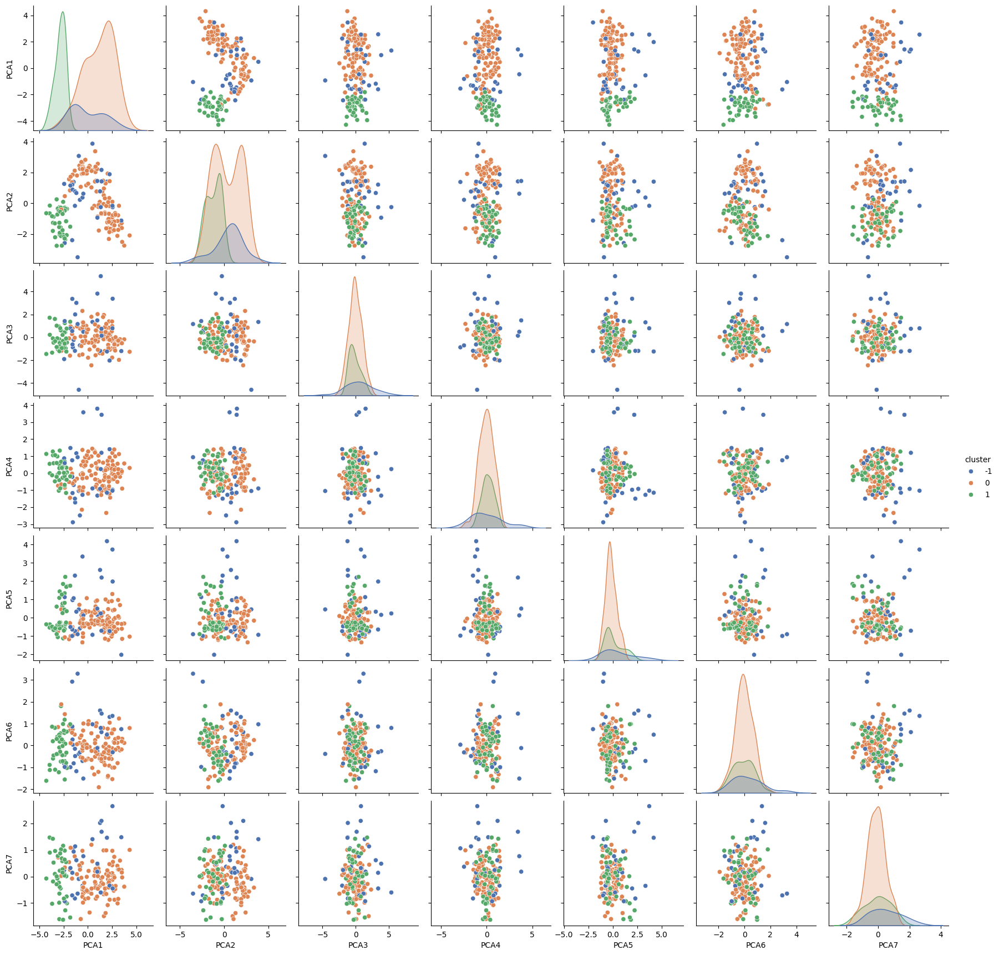

In [31]:
sns.pairplot(data_pca, hue='cluster', palette='deep')
plt.show()

**Silhouette score**

In [32]:
sil_PCA_db1=silhouette_score(data_pca,y_db)
sil_PCA_db1


0.25768325479347143

Silhouette score is less than 0.5 which means clustering is average.

###**3. PCA with 2 components**


In [33]:
pca=PCA(n_components=2).fit(data_sc)
x_pca=pca.transform(data_sc)

data_pca2=pd.DataFrame(x_pca,columns=['PCA1','PCA2'])
data_pca2.head()

,PCA1,PCA2
0,3.316751,-1.443463
1,2.209465,0.333393
2,2.516740,-1.031151
3,3.757066,-2.756372
4,1.008908,-0.869831


In [34]:
X=data_pca2.values

**3.1 KMeans clustering**

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:8

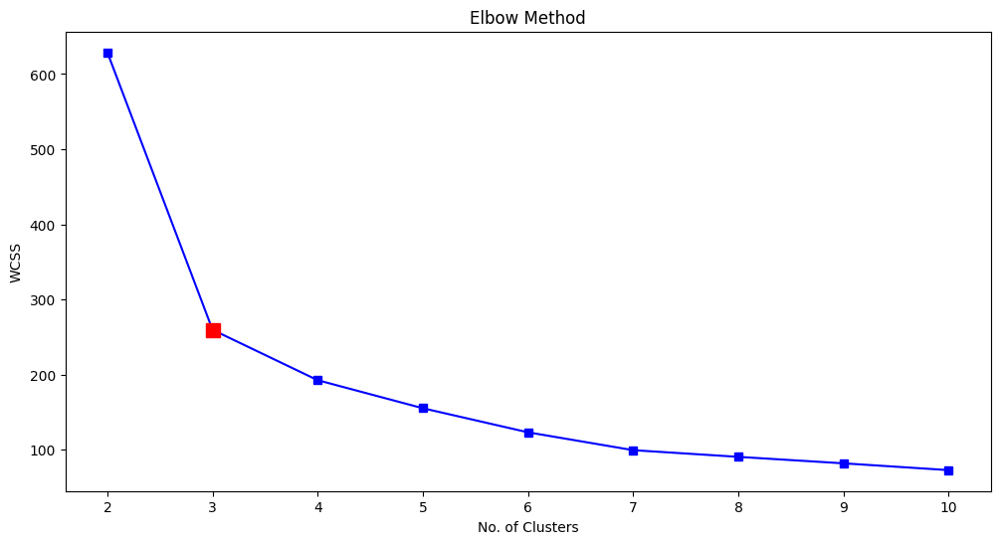

In [35]:
wcss=[]
for i in range(2,11):
  kmeans=KMeans(n_clusters=i, init='k-means++', random_state=42)
  kmeans.fit(X)
  wcss.append(kmeans.inertia_)

plt.plot(range(2,11),wcss,'bs-')

index = 1
index_x = range(2, 11)[index]
index_y = wcss[index]
plt.plot(index_x, index_y, 's', markersize=10,color='r')


plt.title('Elbow Method')
plt.xlabel('No. of Clusters')
plt.ylabel('WCSS')
plt.show()

Using elbow method,Optimum no. of clusters = 3.

**Create model**

In [36]:
kmeans=KMeans(n_clusters=3,init='k-means++')
y_kmeans=kmeans.fit_predict(X)


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


**Plot clusters**

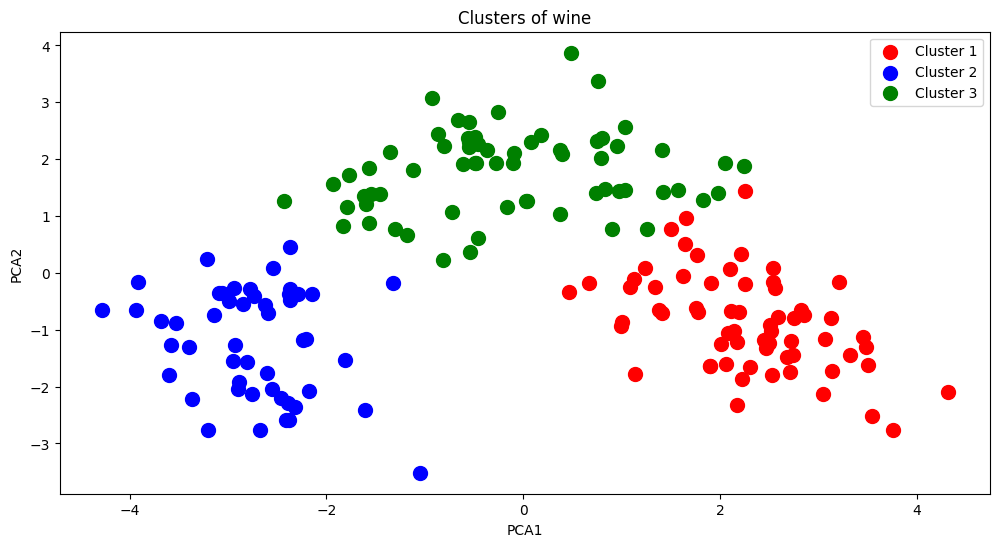

In [37]:
plt.scatter(X[y_kmeans==0,0],X[y_kmeans==0,1],s=100,c='red',label='Cluster 1')
plt.scatter(X[y_kmeans==1,0],X[y_kmeans==1,1],s=100,c='blue',label='Cluster 2')
plt.scatter(X[y_kmeans==2,0],X[y_kmeans==2,1],s=100,c='green',label='Cluster 3')

plt.title('Clusters of wine')
plt.xlabel('PCA1')
plt.ylabel('PCA2')
plt.legend()
plt.show()

**Silhouette score**

In [38]:
sil_PCA_KM2=silhouette_score(X,y_kmeans)
sil_PCA_KM2

0.5610505693103247

Silhouette score is greater than 0.5 which means clustering is good.

**3.2Agglomerative** **clustering**

**Dendogram**

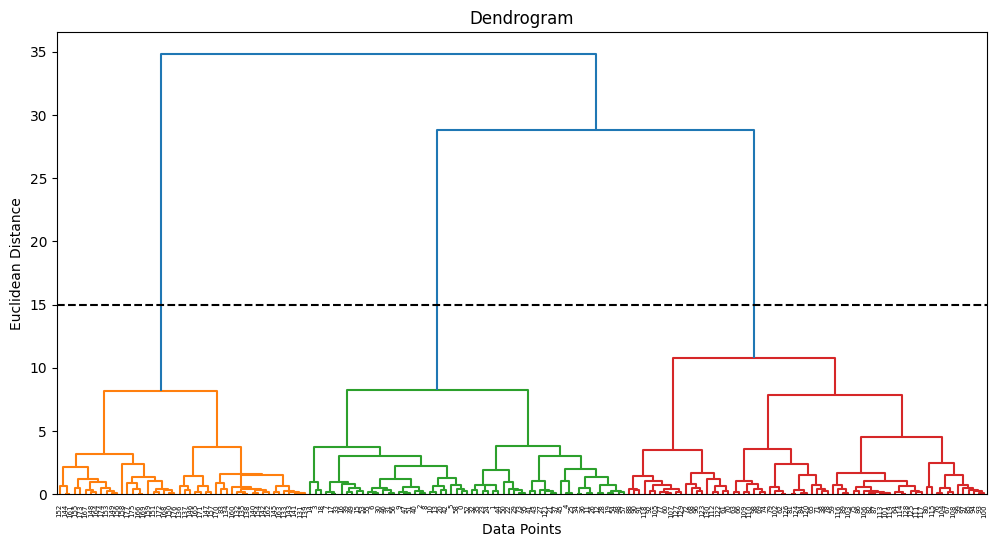

In [39]:
dend=sch.dendrogram(sch.linkage(X,method='ward'))

plt.axhline(y=15, color='black', linestyle='--')
plt.title('Dendrogram')
plt.xlabel('Data Points')
plt.ylabel('Euclidean Distance')
plt.show()


Using Dendogram, Optimum no. of clusters = 3

**Create Model**

In [40]:
hc=AgglomerativeClustering(n_clusters=3,metric='euclidean',linkage='ward')
y_hc=hc.fit_predict(X)


**Plot clusters**

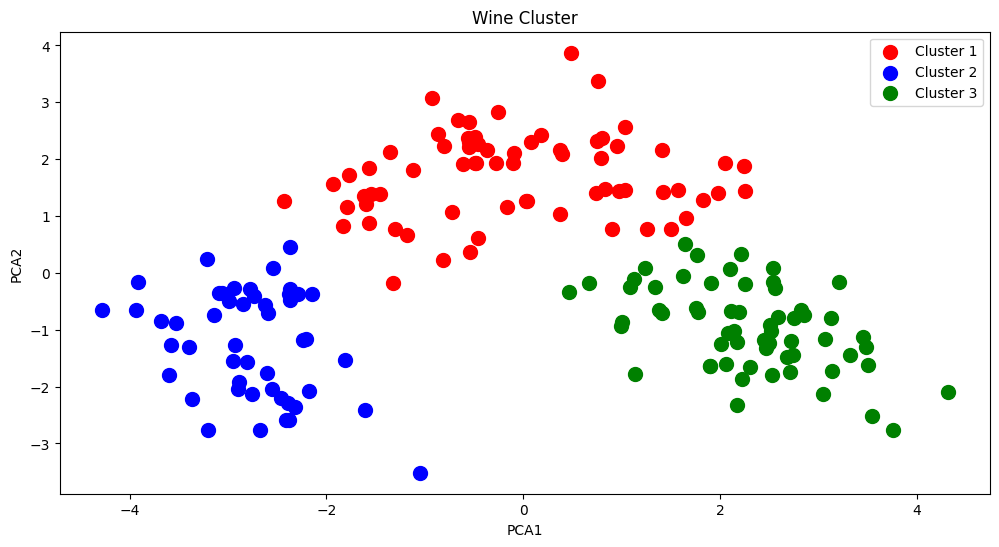

In [41]:
plt.scatter(X[y_hc==0,0],X[y_hc==0,1],s=100,c='red',label='Cluster 1')
plt.scatter(X[y_hc==1,0],X[y_hc==1,1],s=100,c='blue',label='Cluster 2')
plt.scatter(X[y_hc==2,0],X[y_hc==2,1],s=100,c='green',label='Cluster 3')
plt.title('Wine Cluster')
plt.xlabel('PCA1')
plt.ylabel('PCA2')
plt.legend()
plt.show()

**Silhouette score**

In [42]:
sil_PCA_ac2=silhouette_score(X,y_hc)
sil_PCA_ac2

0.5590883962040384

Silhouette score is greater than 0.5 which means clustering is good.


**3.3 DBSCAN clustering**


In [43]:
dbscan = DBSCAN(eps=0.55, min_samples=5).fit(X)
y_db=dbscan.fit_predict(X)
cluster=dbscan.labels_


**Plot clusters**

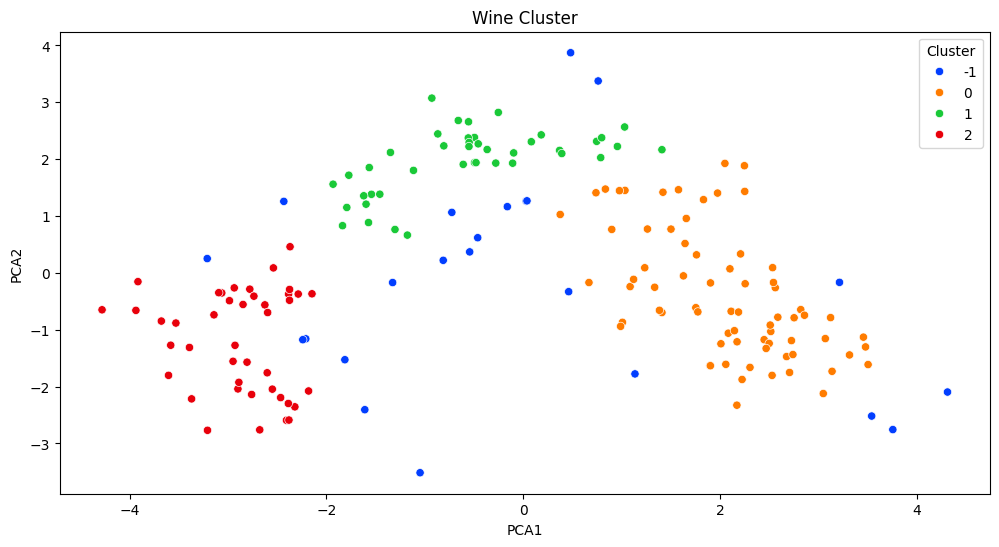

In [44]:
sns.scatterplot(data = data_pca2, x = 'PCA1', y = 'PCA2', hue = cluster, palette='bright')
plt.title('Wine Cluster')
plt.legend(title='Cluster')
plt.show()

Here four clusters are formed. Blue represents the noisy points in the data (-1 cluster).


**Silhouette score**

In [45]:
sil_PCA_db2=silhouette_score(X,y_db)
sil_PCA_db2


0.40815942562739777

Silhouette score is less than 0.5 which means clustering is average. There is some
overlapping between clusters.


###**Comparison between clustering models**

In [46]:
print('\033[1m KMeans\033[0m')
print('   full features:', sil_km  )
print('   7 features: ',sil_PCA_KM1)
print('   2 features: ',sil_PCA_KM2, '\n')

print('\033[1m Agglomerative\033[0m')
print('   full features:', sil_ac  )
print('   7 features: ',sil_PCA_ac1)
print('   2 features: ',sil_PCA_ac2,'\n')

print('\033[1m DBSCAN\033[0m')
print('   full features:', sil_db  )
print('   7 features: ',sil_PCA_db1)
print('   2 features: ',sil_PCA_db2)

 KMeans
   full features: 0.2999306236247228
   7 features:  0.358444172607036
   2 features:  0.5610505693103247 

 Agglomerative
   full features: 0.3140442081423991
   7 features:  0.3418527405229551
   2 features:  0.5590883962040384 

 DBSCAN
   full features: 0.1237790541894091
   7 features:  0.25768325479347143
   2 features:  0.40815942562739777


**Conclusion:**

1. KMeans performs better compared to agglomerative and DBSCAN clustering.
2. Clusters become good when we reduce the number of featues, ie,silhouette score is above 0.5 in case of clusters with 2 features.